# SVM + PCA


## Part 1
- generate artificial datasets
- learn SVClassifier using combinations of those datasets and different initialization parameters (C=< 0.1,1.0 >, kernel={'linear', 'poly', 'sigmoid', 'rbf'})
- compare obtained results and plot the outcome of SVM's decision function.



#### Necessary imports


In [1]:
from sklearn.datasets import make_gaussian_quantiles, make_moons
import matplotlib.pyplot as plt
from sklearn.svm import SVC
import numpy as np 
from typing import Callable, Dict, Tuple, List
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score
from matplotlib.patches import Patch

### Task 1
- generate datasets
- plot datasets


#### Display and normalization routines

In [2]:
def display_2D_dataset(X, Y, colors=["green", "orange"], title=""):
    fig, ax = plt.subplots()
    unique_Y = list(sorted(set(Y)))
    assert len(colors) == len(unique_Y) and len(X[0]) == 2
    for y, c in zip(unique_Y, colors):
        x = X[Y == y]
        ax.scatter(x[:, 0], x[:, 1], c=[c], alpha=0.6)
    ax.set_title(title)
    plt.show()
    
def normalize_data_set(train: np.ndarray, test: np.ndarray =None) -> Tuple[np.ndarray, np.ndarray]:
    scaler = MinMaxScaler()
    scaler.fit(train)
    return (scaler.transform(train), scaler.transform(test) if test is not None else None)

In [3]:
idx = "239512"
gauss_X, gauss_Y = make_gaussian_quantiles(n_samples=int(idx)//int(idx[::2]), n_features=2, n_classes=2, random_state=int(idx), mean=[int(idx[2])/int(idx[3]), int(idx[4])/int(idx[3])], cov=int(idx[4])/int(idx[5]))
gauss_X, _ = normalize_data_set(gauss_X)

In [4]:
moon_X, moon_Y = make_moons(n_samples=int(idx)//int(idx[::2]), shuffle=True, random_state=int(idx), noise=int(idx[-2:0:-1])/int(idx[2:]))
moon_X, _ = normalize_data_set(moon_X)

instead of:
``` python
    noise=int(idx[:-2])
```
I used formula below:
``` python
    noise=int(idx[-2:0:-1])/int(idx[2:])
```
since, for the first case, the generated dataset was too noisy, hence unclassifiable.

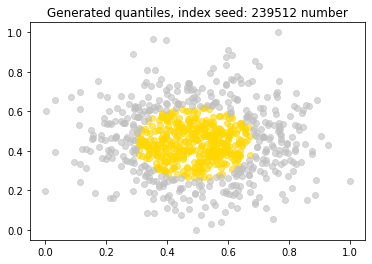

In [5]:
display_2D_dataset(gauss_X, gauss_Y, colors=["gold", "silver"], title=f"Generated quantiles, index seed: {idx} number")

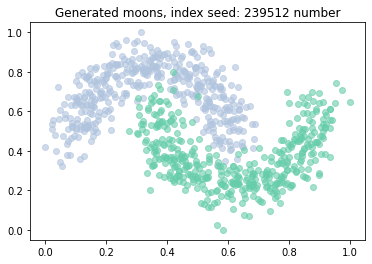

In [6]:
display_2D_dataset(moon_X, moon_Y, colors=["lightsteelblue", "mediumaquamarine"], title=f"Generated moons, index seed: {idx} number")


### Task 2
- preform SVM classification on generated dataset, using different combinations of parameters

#### plotting routines

In [3]:
def make_meshgrid(x, y, h=.02):
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    return xx, yy

def plot_contours(ax, clf, xx, yy, **params):
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z_r = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z_r, **params)
    ax.contour(xx, yy, Z_r, colors="black", alpha=params['alpha'], antialiased=True, linewidths=0.4 )

def plot_classification_split_using_contourf(title, clf, X, Y, colors, y_label="", x_label="", ax=None, alpha=0.5):
    if ax is None: fig, ax = plt.subplots()

    X0, X1 = X[:, 0], X[:, 1]
    xx, yy = make_meshgrid(X0, X1)
    targets = list(sorted(set(Y)))
    plot_contours(ax, clf, xx, yy, levels=[min(targets), np.mean(targets), max(targets)], colors=colors, alpha=0.5)

    for cl, color in zip(targets, colors[:2]):
        x0 = X0[Y == cl]
        x1 = X1[Y == cl]
        ax.scatter(x0, x1, c=[color],  s=20, edgecolors='k', zorder=911)

    ax.set_ylabel(y_label)
    ax.set_xlabel(x_label)
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_title(title, fontsize=11)
    ax.set_ylim(Y.min()-.1, Y.max()+.1)
    ax.set_xlim(X.min()-.1, X.max()+.1)
    ax.legend([
            Patch(facecolor=colors[0]),
            Patch(facecolor=colors[1])
        ], [f"Class: {targets[0]}",f"Class: {targets[1]}"], loc='upper left', bbox_to_anchor=(1,1,1,0))
    if ax is None: plt.show()

#### parameters


d:\Projects\PUM\pum_env\lib\site-packages\sklearn\svm\_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=10000000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
d:\Projects\PUM\pum_env\lib\site-packages\sklearn\svm\_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=10000000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
d:\Projects\PUM\pum_env\lib\site-packages\sklearn\svm\_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=10000000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
d:\Projects\PUM\pum_env\lib\site-packages\sklearn\svm\_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=10000000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
d:\Projects\PUM\pum_env\

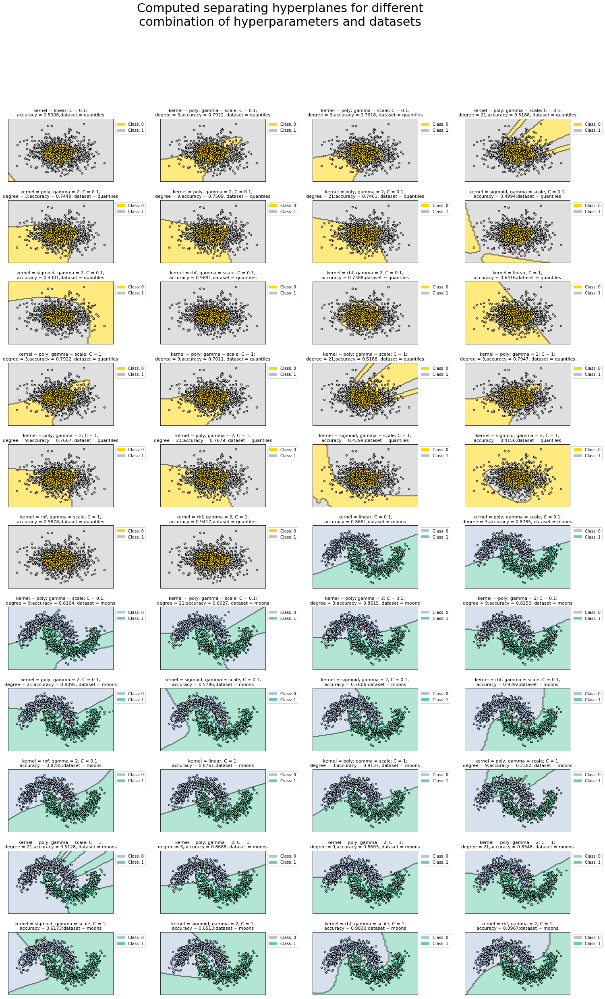

In [8]:
max_iterations = 10000000
C = [0.1, 1]
kernels = ['linear', 'poly', 'sigmoid', 'rbf']
colors = {0:["gold", "silver"], 1:["lightsteelblue", "mediumaquamarine"]}
gammas = ['scale',2]
degrees = [3, 9, 21]
datasets = [(gauss_X, gauss_Y), (moon_X, moon_Y)]
i = 0
fig, axes = plt.subplots(11, 4, figsize=(25, 40))
fig.suptitle("Computed separating hyperplanes for different\ncombination of hyperparameters and datasets", fontsize=30)
axes = axes.flat
for _idx ,dataset in enumerate(datasets):
    x,y = dataset
    for c in C:
        for kernel in kernels:
            if kernel == 'rbf' or kernel == 'sigmoid':
                for gamma in gammas:
                    svm = SVC(C=c, kernel=kernel, gamma=gamma, max_iter = max_iterations)
                    svm.fit(x, y)
                    y_pred = svm.predict(x)
                    acc = accuracy_score(y, y_pred)
                    plot_classification_split_using_contourf(f"kernel = {kernel}; gamma = {gamma}; C = {c};\naccuracy = {acc:.4f};"+
                                                               f"dataset = {('moons' if  _idx == 1 else 'quantiles')}",
                                                               svm, x, y, colors[_idx], ax=axes[i])
                    i+=1
            elif kernel == 'poly':
                for gamma in gammas:
                    for degree in degrees:
                        svm = SVC(C=c, kernel=kernel, degree=degree, gamma=gamma, max_iter = max_iterations)
                        svm.fit(x, y)
                        y_pred = svm.predict(x)
                        acc = accuracy_score(y, y_pred)
                        plot_classification_split_using_contourf(f"kernel = {kernel}; gamma = {gamma}; C = {c};\ndegree = {degree};"+
                                                                   f"accuracy = {acc:.4f}, dataset = {('moons' if  _idx == 1 else 'quantiles')}",
                                                                   svm, x, y, colors[_idx], ax=axes[i])
                        i+=1
            else:
                svm = SVC(C=c, kernel=kernel, max_iter = max_iterations)
                svm.fit(x, y)
                y_pred = svm.predict(x)
                acc = accuracy_score(y, y_pred)
                plot_classification_split_using_contourf(f"kernel = {kernel}; C = {c};\naccuracy = {acc:.4f};"+
                                                          f"dataset = {('moons' if  _idx == 1 else 'quantiles')}",
                                                           svm, x, y, colors[_idx], ax=axes[i])
                i+=1

fig.subplots_adjust(wspace=0.45, hspace=0.3)        
plt.show()



### Conclusions
- The 'C' parameter, responsible for regularization of classifier, defines a trade off between best acurracy and simplicity of decision function, that is, the greater C is, the more accurately model will behave to capture and classify dataset properly - curves of computed sepearation limit, should be noticable, as well as narrower margin between clusters (e.g. see the rbf kernel example for moon's dataset; classifier was initialized with scaled gamma, and one of two values of C, 0.1 and 1, if the C is equal to 1, the computed hyperplane limit bends significantly, and boundary fits much better). 
- The manipulation of 'gamma' parameter is also crucial, the greater gamma is, the greater impact single sample has on result of classification; in some of shown cases it helped to acheive better results of classification (e.g. for polynomial kernel). The effect of increasing a gamma parameter is generally opposite to the effect of increasing C parameter - the rise of gamma reduces the effect of high variance in dataset (but it could be cost model of its accuracy).
- The degree of polynomial kernel cannot be too large, according to examined datasets. The 21th degree used to deteriorate the efficiency and the accuracy of SVM classification using Polynomial kernel - not only the results were far from perfection, but also algorithm couldn't converge in 10 000 000 iterations. 
- In terms of kernels used in experiment, the RBF kernel performed best, the decision boundary of this algorithm often covers the limit between two classes of dataset - this method is able to approximate any polynomial function. For provided classification problems, the RBF kernel converges much faster than Polynomial or Sigmoid kernel, what is also important. However RBF kernel is not recommended to perform computations on very large datasets.
- For analyzed datasets, it could be initially assumed, that sigmoid kernel should easily resolve the problem of moons' dataset, due to the shape of function, however this kernel performed inaccurate classification in almost all cases.
- To get the best results, the hyperparameters of classifier should be choosen by trial-and-error approach, or using specific tools to solve this problem.

## Part 2
- download pulsars' dataset from https://archive.ics.uci.edu/ml/machine-learning-databases/00372/HTRU2.zip
- perform exploratory analysis of dataset
- split dataset to training and test datasets, applying stratification
- normalize dataset
- perform classification (using PCA, GridSearch, SVM)


### Task 1

#### Dataset description:
- Attributes: 
    1. Mean of the integrated profile.
    2. Standard deviation of the integrated profile.
    3. Excess kurtosis of the integrated profile.
    4. Skewness of the integrated profile.
    5. Mean of the DM-SNR curve.
    6. Standard deviation of the DM-SNR curve.
    7. Excess kurtosis of the DM-SNR curve.
    8. Skewness of the DM-SNR curve.
    9. Class

#### Download dataset



In [4]:
import urllib.request, zipfile, io, pandas as pd
header = ["Mean of the integrated profile", "Standard deviation of the integrated profile","Excess kurtosis of the integrated profile",
"Skewness of the integrated profile","Mean of the DM-SNR curve", "Standard deviation of the DM-SNR curve","Excess kurtosis of the DM-SNR curve",
"Skewness of the DM-SNR curve", "Class"]
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/00372/HTRU2.zip"
name = "HTRU_2.csv"
with urllib.request.urlopen(url) as _file:
    z = zipfile.ZipFile(io.BytesIO(_file.read()))
    f = z.open(name)
    table = pd.read_csv(f, delimiter=',', names=header )
table

,Mean of the integrated profile,Standard deviation of the integrated profile,Excess kurtosis of the integrated profile,Skewness of the integrated profile,Mean of the DM-SNR curve,Standard deviation of the DM-SNR curve,Excess kurtosis of the DM-SNR curve,Skewness of the DM-SNR curve,Class
0,140.562500,55.683782,-0.234571,-0.699648,3.199833,19.110426,7.975532,74.242225,0
1,102.507812,58.882430,0.465318,-0.515088,1.677258,14.860146,10.576487,127.393580,0
2,103.015625,39.341649,0.323328,1.051164,3.121237,21.744669,7.735822,63.171909,0
3,136.750000,57.178449,-0.068415,-0.636238,3.642977,20.959280,6.896499,53.593661,0
4,88.726562,40.672225,0.600866,1.123492,1.178930,11.468720,14.269573,252.567306,0
...,...,...,...,...,...,...,...,...,...
17893,136.429688,59.847421,-0.187846,-0.738123,1.296823,12.166062,15.450260,285.931022,0
17894,122.554688,49.485605,0.127978,0.323061,16.409699,44.626893,2.945244,8.297092,0
17895,119.335938,59.935939,0.159363,-0.743025,21.430602,58.872000,2.499517,4.595173,0
17896,114.507812,53.902400,0.201161,-0.024789,1.946488,13.381731,10.007967,134.238910,0


### Task 2

#### Dataset exploratory analysis

#### Count of missing values per column

In [5]:
table.isna().sum()

Mean of the integrated profile                  0
Standard deviation of the integrated profile    0
Excess kurtosis of the integrated profile       0
Skewness of the integrated profile              0
Mean of the DM-SNR curve                        0
Standard deviation of the DM-SNR curve          0
Excess kurtosis of the DM-SNR curve             0
Skewness of the DM-SNR curve                    0
Class                                           0
dtype: int64

In [6]:
table.index[np.isinf(table).any(1)]

Int64Index([], dtype='int64')

#### Convert data to numbers


In [7]:
table[header[:-1]] = table[header[:-1]].apply(lambda x: x.apply(lambda _x: float(_x)))
table["Class"] = table["Class"].apply(lambda x: int(x))
table

,Mean of the integrated profile,Standard deviation of the integrated profile,Excess kurtosis of the integrated profile,Skewness of the integrated profile,Mean of the DM-SNR curve,Standard deviation of the DM-SNR curve,Excess kurtosis of the DM-SNR curve,Skewness of the DM-SNR curve,Class
0,140.562500,55.683782,-0.234571,-0.699648,3.199833,19.110426,7.975532,74.242225,0
1,102.507812,58.882430,0.465318,-0.515088,1.677258,14.860146,10.576487,127.393580,0
2,103.015625,39.341649,0.323328,1.051164,3.121237,21.744669,7.735822,63.171909,0
3,136.750000,57.178449,-0.068415,-0.636238,3.642977,20.959280,6.896499,53.593661,0
4,88.726562,40.672225,0.600866,1.123492,1.178930,11.468720,14.269573,252.567306,0
...,...,...,...,...,...,...,...,...,...
17893,136.429688,59.847421,-0.187846,-0.738123,1.296823,12.166062,15.450260,285.931022,0
17894,122.554688,49.485605,0.127978,0.323061,16.409699,44.626893,2.945244,8.297092,0
17895,119.335938,59.935939,0.159363,-0.743025,21.430602,58.872000,2.499517,4.595173,0
17896,114.507812,53.902400,0.201161,-0.024789,1.946488,13.381731,10.007967,134.238910,0


- Downloaded dataset contains (apart from target column 'Class') only continuous attributes
- If there was a need to select best attributes, the Chi2 selection algorithm could be used, since it performs best on large datasets.
- Values should be normalized, because of significant difference in attributes' values ranges in terms of feature space of this dataset.

### Task 3
- split dataset
- apply normalization

#### Split obtained dataset into test and train dataframes, taking stratification into consideration

In [30]:
train, test = train_test_split(table, stratify=table.Class, random_state=239512, test_size=0.2)
train

,Mean of the integrated profile,Standard deviation of the integrated profile,Excess kurtosis of the integrated profile,Skewness of the integrated profile,Mean of the DM-SNR curve,Standard deviation of the DM-SNR curve,Excess kurtosis of the DM-SNR curve,Skewness of the DM-SNR curve,Class
15210,92.117188,48.602762,0.583279,0.357874,1.560201,17.490147,11.716992,141.568832,0
5525,142.554688,56.754792,-0.263939,-0.873393,52.304348,81.789370,1.039535,-0.717235,0
16258,91.210938,36.213700,0.426461,2.443080,0.847826,10.696337,16.360979,318.429721,0
17734,102.726562,50.696202,0.450554,-0.051022,2.019231,14.545700,10.517916,132.917259,0
11222,110.820312,37.467368,0.211653,1.138414,5.412207,25.915475,5.686697,35.832485,0
...,...,...,...,...,...,...,...,...,...
2448,124.570312,56.349590,0.103723,-0.561383,17.150502,49.035521,2.847956,7.093757,0
7773,113.648438,48.444490,0.287555,0.468926,5.285953,27.863562,5.633567,32.555527,0
6801,132.484375,43.230303,0.043148,0.513480,4.278428,21.477496,6.482718,49.706546,0
3470,112.007812,43.635295,0.214345,0.350373,3.323579,18.276348,7.107208,61.272996,0


In [9]:
test

,Mean of the integrated profile,Standard deviation of the integrated profile,Excess kurtosis of the integrated profile,Skewness of the integrated profile,Mean of the DM-SNR curve,Standard deviation of the DM-SNR curve,Excess kurtosis of the DM-SNR curve,Skewness of the DM-SNR curve,Class
8009,132.398438,48.296179,-0.147035,0.022784,1.826923,18.680315,10.733251,116.800143,0
3744,89.796875,41.239461,0.691221,1.253321,5.403846,27.191381,5.795925,36.518680,0
8545,131.445312,50.274995,0.194028,-0.297258,1.498328,12.968479,12.124664,183.295974,0
3377,100.609375,47.755928,0.402585,0.527538,2.064381,15.318416,10.852763,139.321217,0
5509,101.742188,44.636946,0.310742,0.591603,2.793478,18.113863,8.842717,89.845664,0
...,...,...,...,...,...,...,...,...,...
8299,88.953125,39.228071,1.282052,3.199935,98.509197,90.325280,-0.022611,-1.771499,0
13862,129.609375,45.212905,0.594097,0.752459,101.464047,98.480069,0.143041,-1.750200,0
1917,93.390625,35.522931,0.596736,2.643346,5.326087,26.745625,6.102823,40.562242,0
2881,126.515625,46.619970,0.077809,0.399820,1.412207,12.277783,12.606403,198.848191,0


#### Normalization of dataset

In [31]:
train.iloc[:, :-1], test.iloc[:, :-1] = normalize_data_set(train[header[:-1]], test[header[:-1]])
train

d:\Projects\PUM\pum_env\lib\site-packages\pandas\core\indexing.py:1835: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value[:, i].tolist(), pi)


,Mean of the integrated profile,Standard deviation of the integrated profile,Excess kurtosis of the integrated profile,Skewness of the integrated profile,Mean of the DM-SNR curve,Standard deviation of the DM-SNR curve,Excess kurtosis of the DM-SNR curve,Skewness of the DM-SNR curve,Class
15210,0.467499,0.321828,0.236685,0.030619,0.006035,0.098881,0.394284,0.120317,0
5525,0.740711,0.432009,0.150301,0.013000,0.233405,0.727158,0.110905,0.001046,0
16258,0.462590,0.154379,0.220696,0.060457,0.002844,0.032498,0.517535,0.268570,0
17734,0.524968,0.350122,0.223152,0.024768,0.008092,0.070111,0.362460,0.113065,0
11222,0.568811,0.171323,0.198793,0.041788,0.023295,0.181206,0.234240,0.031684,0
...,...,...,...,...,...,...,...,...,...
2448,0.643292,0.426532,0.187788,0.017465,0.075891,0.407115,0.158900,0.007593,0
7773,0.584130,0.319688,0.206532,0.032208,0.022729,0.200241,0.232830,0.028937,0
6801,0.686162,0.249214,0.181612,0.032846,0.018215,0.137842,0.255367,0.043314,0
3470,0.575243,0.254688,0.199068,0.030512,0.013937,0.106563,0.271941,0.053009,0


In [11]:
test

,Mean of the integrated profile,Standard deviation of the integrated profile,Excess kurtosis of the integrated profile,Skewness of the integrated profile,Mean of the DM-SNR curve,Standard deviation of the DM-SNR curve,Excess kurtosis of the DM-SNR curve,Skewness of the DM-SNR curve,Class
8009,0.685696,0.317684,0.162221,0.025824,0.007231,0.110510,0.368175,0.099555,0
3744,0.454930,0.222306,0.247691,0.043432,0.023258,0.193673,0.237139,0.032259,0
8545,0.680533,0.344429,0.196996,0.021244,0.005758,0.054699,0.405103,0.155294,0
3377,0.513500,0.310382,0.218261,0.033047,0.008295,0.077661,0.371347,0.118433,0
5509,0.519636,0.268226,0.208897,0.033964,0.011561,0.104976,0.318001,0.076960,0
...,...,...,...,...,...,...,...,...,...
8299,0.450360,0.195121,0.307934,0.071288,0.440436,0.810563,0.082716,0.000162,0
13862,0.670588,0.276011,0.237788,0.036265,0.453676,0.890245,0.087112,0.000180,0
1917,0.474397,0.145043,0.238057,0.063323,0.022909,0.189318,0.245284,0.035648,0
2881,0.653830,0.295028,0.185146,0.031219,0.005372,0.047950,0.417889,0.168331,0


### Task 4
- hiperparameters selection
- SVM classification
- RoC curve, AuC computation

#### Additional imports  

In [20]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve, auc, plot_roc_curve, confusion_matrix, ConfusionMatrixDisplay
from sklearn.decomposition import PCA


#### Find the best hyperparameters

In [13]:
svc = SVC()
gs_cv = GridSearchCV(svc, param_grid={'C':[0.1, 1, 5, 1000],
                                      'max_iter':[1_000_000],
                                      'gamma':[5, 1, 'scale'], 
                                      "degree":[3, 9, 15], 
                                      "kernel":["rbf", "poly", 'sigmoid'] }, n_jobs=4, refit=True, verbose=2)
gs_cv.fit(train[header[:-1]], train["Class"])               

Fitting 5 folds for each of 108 candidates, totalling 540 fits


GridSearchCV(estimator=SVC(), n_jobs=4,
             param_grid={'C': [0.1, 1, 5, 1000], 'degree': [3, 9, 15],
                         'gamma': [5, 1, 'scale'],
                         'kernel': ['rbf', 'poly', 'sigmoid'],
                         'max_iter': [1000000]},
             verbose=2)

#### Result of grid-search cross-validator - best hyperparameters

In [14]:
gs_cv.best_params_

{'C': 5, 'degree': 3, 'gamma': 5, 'kernel': 'poly', 'max_iter': 1000000}

#### Receiver operating characteristic curve

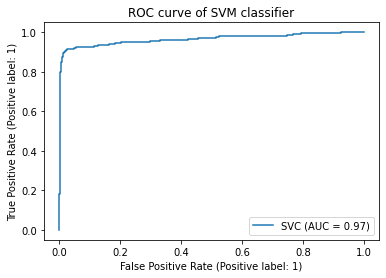

In [26]:
svm = gs_cv.best_estimator_
fig, ax = plt.subplots()
plot_roc_curve(svm, test[header[:-1]], test["Class"],ax=ax)
ax.set_title("ROC curve of SVM classifier")
plt.show()

#### Confusion matrix of performed classification

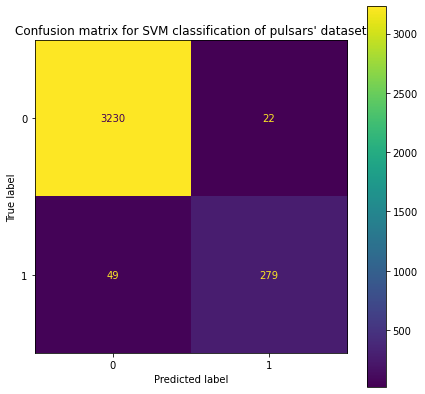

In [25]:
pred_Class = svm.predict(test[header[:-1]])
conf_mat = confusion_matrix(test["Class"], pred_Class, labels=[0,1])
figure = ConfusionMatrixDisplay(conf_mat, display_labels=[0,1])
fig, ax = plt.subplots(figsize=(7,7))
figure.plot(ax=ax)
ax.set_title(f"Confusion matrix for SVM classification of pulsars' dataset")
plt.show()

#### AUC computation

In [27]:
false_positives_c, true_positives_c, _ = roc_curve(test["Class"], pred_Class)
auc(false_positives_c, true_positives_c) 

0.9219223442234422

#### Conclusions and answer to question - Which values should computed confusion matrix aim to?:
- The answer to this question is: the count of misclasified pulsars - false positives - should be reduced - we do not want to explore space probe instead of 'detected' pulsar.
- GridSearchCV consumed a lot memory and computational power, for large datasets is not optimal.  

### Task 5

- PCA transformation
- select hyperparameters one more time
- classify dataset and show results

#### PCA transoformation (it is expected at least 90% of variance)

In [33]:
transformer = PCA(svd_solver='full', n_components=0.9)
transformer.fit(train[header[:-1]])
transformed_train_X = transformer.transform(train[header[:-1]])
transformed_test_X = transformer.transform(test[header[:-1]])

#### Fit new, transformed data to find the best hyperparameters

In [36]:
svc = SVC()
gs_cv = GridSearchCV(svc, param_grid={'C':[0.1, 1, 5, 1000],
                                      'max_iter':[1_000_000],
                                      'gamma':[5, 1, 'scale'], 
                                      "degree":[3, 9, 15], 
                                      "kernel":["rbf", "poly", 'sigmoid'] }, n_jobs=4, refit=True, verbose=2)
gs_cv.fit(transformed_train_X, train["Class"])  

Fitting 5 folds for each of 108 candidates, totalling 540 fits
d:\Projects\PUM\pum_env\lib\site-packages\sklearn\svm\_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=1000000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)


GridSearchCV(estimator=SVC(), n_jobs=4,
             param_grid={'C': [0.1, 1, 5, 1000], 'degree': [3, 9, 15],
                         'gamma': [5, 1, 'scale'],
                         'kernel': ['rbf', 'poly', 'sigmoid'],
                         'max_iter': [1000000]},
             verbose=2)

#### Result of grid-search cross-validator - best hyperparameters

In [37]:
gs_cv.best_params_

{'C': 1000,
 'degree': 3,
 'gamma': 'scale',
 'kernel': 'rbf',
 'max_iter': 1000000}

#### Receiver operating characteristic curve

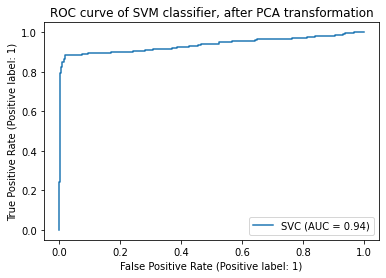

In [38]:
svm = gs_cv.best_estimator_
fig, ax = plt.subplots()
plot_roc_curve(svm, transformed_test_X, test["Class"],ax=ax)
ax.set_title("ROC curve of SVM classifier, after PCA transformation")
plt.show()

#### Confusion matrix of performed classification

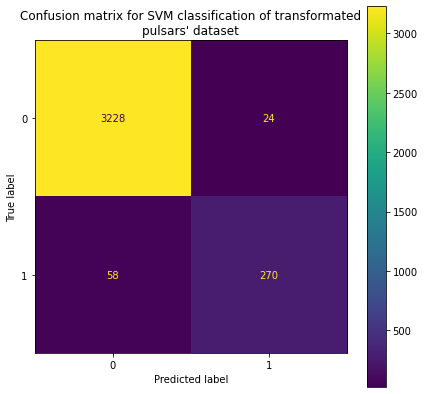

In [46]:
pred_Class = svm.predict(transformed_test_X)
conf_mat = confusion_matrix(test["Class"], pred_Class, labels=[0,1])
figure = ConfusionMatrixDisplay(conf_mat, display_labels=[0,1])
fig, ax = plt.subplots(figsize=(7,7))
figure.plot(ax=ax)
ax.set_title(f"Confusion matrix for SVM classification of transformated\npulsars' dataset")
plt.show()

#### AUC computation

In [40]:
false_positives_c, true_positives_c, _ = roc_curve(test["Class"], pred_Class)
auc(false_positives_c, true_positives_c) 

0.9078953289532895

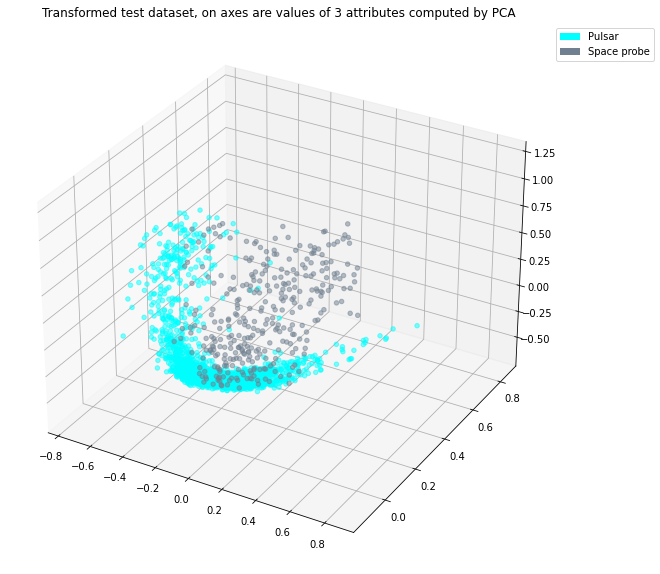

In [45]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.patches import Patch
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
pulsars = transformed_test_X[test["Class"].values == 0]
space_probes = transformed_test_X[test["Class"].values == 1]
ax.scatter(pulsars[:,1], pulsars[:,2], pulsars[:,0], c="cyan", alpha=0.5)
ax.scatter(space_probes[:,1], space_probes[:,2], space_probes[:,0], c="slategrey", alpha=0.5)
ax.legend([Patch(facecolor="cyan"),
            Patch(facecolor="slategrey")], ["Pulsar", "Space probe"], loc='upper left', bbox_to_anchor=(1,1,1,0))
ax.set_title("Transformed test dataset, on axes are values of 3 attributes computed by PCA")
plt.show()

#### Conclusions and observations
- PCA transformation could not improve the score of classification. There are more false negatives and false positives, what can be noticed on resulted confusion matrix and ROC curve. 
- The target 90% variance, was probably to small to obtain more promising results.